# Examples of Using Prefect + Funnel with CESM data

In [1]:
import os
os.environ["PREFECT__FLOWS__CHECKPOINTING"] = "True"
from esm_collections import calc
import ast
import os
from prefect import Flow, Parameter, task
from xpersist import CacheStore, XpersistResult
import intake
import prefect
from distributed import Client
from ncar_jobqueue import NCARCluster
import xcollection as xc
import holoviews as hv
import pop_tools
import hvplot
import xarray as xr
import hvplot.xarray
prefect.context.to_dict()['config']['flows']
import tempfile

/Users/jkent/miniconda3/envs/esm-collections-dev/lib/python3.9/site-packages/dask_jobqueue/core.py:20: FutureWarning: tmpfile is deprecated and will be removed in a future release. Please use dask.utils.tmpfile instead.
  from distributed.utils import tmpfile


In [3]:
prefect.context.to_dict()['config']['flows']['checkpointing']


True

Directory for our funnel cache -- does this have to change with Max leaving? Do we plan on making this more generic anyway for any user, do we need to explain how to get this directory on glade? Will this work elsewhere?

In [2]:
cache_dir = f'{tempfile.gettempdir()}/my-cache'

store = CacheStore(cache_dir)
store

CacheStore(path='/var/folders/dd/_xm_pbpd3flgbvbnt7qhd70snnbpj_/T/my-cache', readonly=False, on_duplicate_key=<DuplicateKeyEnum.skip: 'skip'>, storage_options={})

In [3]:
CacheStore(path='/tmp/my-cache', readonly=False, on_duplicate_key='skip', storage_options={})

CacheStore(path='/tmp/my-cache', readonly=False, on_duplicate_key=<DuplicateKeyEnum.skip: 'skip'>, storage_options={})

I'm trying to locate the code for `funnel.prefect.result.FunnelResult` -- https://github.com/ncar-xdev/xpersist/blob/main/xpersist/prefect/result.py 

In [4]:
r = XpersistResult(store, serializer='xcollection')

#To enable persisting output of a task in xpersist’s cache store, we need to define a xpersist.XpersistResult object and pass it to the result argument of the task decorator.

#What makes a good dataset for this example? Needs to have long term mean, annual mean, and global average

#Going to focus om getting a dataset into intake-esm first

## Setup your Tasks

In [5]:
# Deal with Intake-ESM catalogs
@task
def read_catalog(path, csv_kwargs):
    return intake.open_esm_datastore(path, csv_kwargs=csv_kwargs)

@task
def subset_catalog(catalog, search_dict):
    return catalog.search(**search_dict)

@task
def load_data(catalog, cdf_kwargs):
    return catalog.to_dataset_dict(cdf_kwargs=cdf_kwargs)


# Calculations
@task
def subset_dates(catalog, search_dict, date_subset):
    search_dict.update({'date':catalog.df.date[date_subset].values})
    return catalog.search(**search_dict)

@task
def convert_to_collection(dsets):
    return xc.Collection(dsets)

@task
def center_time(collection):
    return collection.map(calc.center_time)

#cache to target directory, using handling info from above `r`, these are user written fxs
@task(target="long_term_mean/", result=r)
def long_term_mean(collection):
    return collection.map(calc.temporal_average)

@task(target="annual_mean/", result=r)
def annual_mean(collection):
    return collection.map(calc.yearly_average)

@task
def global_average(ds, horizontal_dims, area_field, land_sea_mask, time_dim, include_ms=False):
    return calc.global_mean(ds, horizontal_dims=horizontal_dims, area_field=area_field, land_sea_mask=land_sea_mask, time_dim=time_dim, normalize=True)

@task
def global_integral(ds, horizontal_dims, area_field, land_sea_mask, time_dim, include_ms=False):
    return calc.global_mean(ds, horizontal_dims=horizontal_dims, area_field=area_field, land_sea_mask=land_sea_mask, time_dim=time_dim, normalize=False)

@task
def zonal_average(da, grid, lat_field, ydim, xdim, lat_axis, region_mask=None):
    return calc.zonal_mean(da=da, grid=grid, lat_field=lat_field, ydim=ydim, xdim=xdim, lat_axis=lat_axis, region_mask=region_mask)


## Setup the Flow Using A Collection Json

In [6]:
with Flow('timeseries_collection_from_json') as timeseries_collection_from_json: #from Prefect
    path = Parameter('path', ) #prefect parameter, these parameters are supplied as arguments to the Flow (acts like a fx)
    csv_kwargs = Parameter('csv_kwargs', default={})
    search_dict = Parameter('search_dict', default={})
    cdf_kwargs = Parameter('cdf_kwargs', default={'chunks':{}})

    # Read in the data catalog
    data_catalog = read_catalog(path, csv_kwargs)

    # Subset the catalog
    catalog_subset = subset_catalog(data_catalog, search_dict)

    # Load the data
    dsets_timeseries = load_data(catalog_subset, cdf_kwargs=cdf_kwargs)

    # Convert to xcollection
    collection_timeseries = convert_to_collection(dsets_timeseries)

    # Center time
    collection_timeseries_center_time = center_time(collection_timeseries)
    
    # Calculate a long-term mean ##cached these last 2 can be done in parallel via prefect flow
    long_term_average = long_term_mean(collection_timeseries_center_time)
    
    # Calculate the annual average  ##cached
    annual_average = annual_mean(collection_timeseries_center_time)

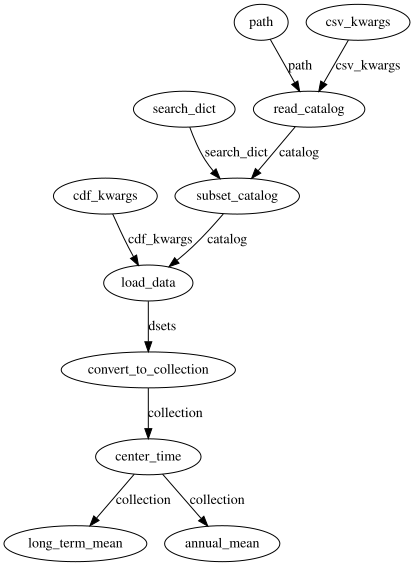

In [7]:
#Automatically display graphs with 
timeseries_collection_from_json.visualize()

## Execute our Flow

### Spin up a Dask Cluster

In [8]:
cluster = NCARCluster()
cluster.scale(10)
client = Client(cluster)
client

/Users/jkent/miniconda3/envs/esm-collections-dev/lib/python3.9/site-packages/ncar_jobqueue/cluster.py:17: UserWarning: Unable to determine which NCAR cluster you are running on...Using a local cluster via `distributed.LocalCluster`.
  warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 10
Total threads: 20,Total memory: 40.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:52921,Workers: 10
Dashboard: http://127.0.0.1:8787/status,Total threads: 20
Started: Just now,Total memory: 40.00 GiB
Comm: tcp://127.0.0.1:52938,Total threads: 2
Dashboard: http://127.0.0.1:52939/status,Memory: 4.00 GiB
Nanny: tcp://127.0.0.1:52926,


In [9]:
timeseries_collection_from_json.run(path="/glade/campaign/cesm/development/omwg/projects/MOMMARBL_vs_POPECO/catalog/MOMvsPOP.json",
                                    search_dict={'stream':'pop.h', 'variable':['TEMP', 'SALT', 'FG_CO2']})

                                    #intake-esm paried down small catalogue and data that downloads with package to be used in tutorials

[2022-02-02 11:04:40-0700] INFO - prefect.FlowRunner | Beginning Flow run for 'timeseries_collection_from_json'
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'path': Starting task run...
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'path': Finished task run for task with final state: 'Success'
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'search_dict': Starting task run...
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'search_dict': Finished task run for task with final state: 'Success'
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Starting task run...
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Finished task run for task with final state: 'Success'
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Starting task run...
[2022-02-02 11:04:40-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Finished task run for task with final state: 'Success'
[2

<Failed: "Some reference tasks failed.">

In [16]:
annual_mean_collection = xc.open_collection(f'{cache_dir}/annual_mean')

GroupNotFoundError: group not found at path ''

In [99]:
long_term_mean_collection = xc.open_collection(f'{cache_dir}/long_term_mean')

In [117]:
long_term_mean_collection['ocn.pop.h.pop_control']

<xarray.Dataset>
Dimensions:  (nlat: 384, nlon: 320, z_t: 60)
Coordinates:
    TLAT     (nlat, nlon) float64 ...
    TLONG    (nlat, nlon) float64 ...
    ULAT     (nlat, nlon) float64 ...
    ULONG    (nlat, nlon) float64 ...
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    FG_CO2   (nlat, nlon) float32 ...
    SALT     (z_t, nlat, nlon) float32 ...
    TEMP     (z_t, nlat, nlon) float32 ...
Attributes: (12/13)
    Conventions:             CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf...
    calendar:                All years have exactly  365 days.
    cell_methods:            cell_methods = time: mean ==> the variable value...
    contents:                Diagnostic and Prognostic Variables
    history:                 none
    intake_esm_dataset_key:  ocn.pop.h.pop_control
    ...                      ...
    model_doi_url:           https://doi.org/10.5065/D67H1H0V
    revision:                $Id$
    source:                  CCSM POP2, the CCSM Ocean Component
    start_time:              This dataset was created on 2021-10-01 at 11:35:...
    time_period_freq:        month_1
    title:                   pop_control

## Add a Plotting Function

We start first with a function that operates on an **`xarray.Dataset`**

In [101]:
def plot_2D(ds, xdim, ydim):
    ds[xdim] = ds[xdim]
    ds[ydim] = ds[ydim]
    variables = list(set(ds.variables) - set(ds.coords))
    return ds.hvplot.quadmesh(x=xdim, y=ydim, z=variables, cmap='magma', levels=20, rasterize=True)

Then, we modify it to be applied to collection of datasets (`xcollection.Collection`)

In [11]:
@task
def apply_plot2D(collection, xdim, ydim, ncols=1):
    plots = []
    for key in collection.keys():
        plots.append(plot_2D(collection[key], xdim, ydim))
    return hv.Layout(plots).cols(ncols)

In [12]:
with Flow('timeseries_collection_from_json') as timeseries_collection_from_json:
    path = Parameter('path', )
    csv_kwargs = Parameter('csv_kwargs', default={})
    search_dict = Parameter('search_dict', default={})
    cdf_kwargs = Parameter('cdf_kwargs', default={'chunks':{}})

    # Read in the data catalog
    data_catalog = read_catalog(path, csv_kwargs)

    # Subset the catalog
    catalog_subset = subset_catalog(data_catalog, search_dict)

    # Load the data
    dsets_timeseries = load_data(catalog_subset, cdf_kwargs=cdf_kwargs)

    # Convert to xcollection
    collection_timeseries = convert_to_collection(dsets_timeseries)

    # Center time
    collection_timeseries_center_time = center_time(collection_timeseries)
    
    # Calculate a long-term mean
    long_term_average = long_term_mean(collection_timeseries_center_time)
    long_term_average_plot = apply_plot2D(long_term_average, xdim='nlon', ydim='nlat')
    
    # Calculate the annual average
    annual_average = annual_mean(collection_timeseries_center_time)
    annual_average_plot = apply_plot2D(annual_average, xdim='nlon', ydim='nlat')
    

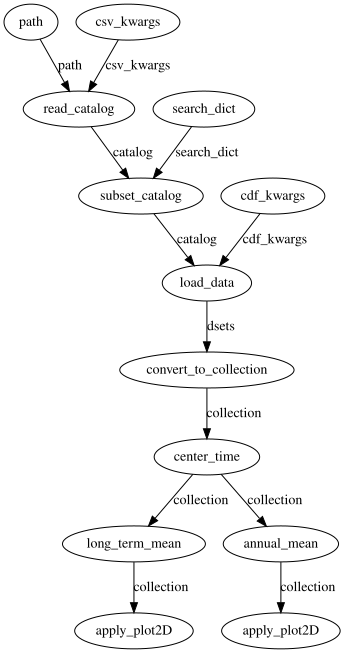

In [14]:
timeseries_collection_from_json.visualize()

### Run this again!

In [104]:
timeseries_with_plots = timeseries_collection_from_json.run(path="/glade/campaign/cesm/development/omwg/projects/MOMMARBL_vs_POPECO/catalog/MOMvsPOP.json",
                                                            search_dict={'stream':'pop.h', 'variable':['TEMP', 'SALT', 'FG_CO2']})

[2021-12-01 14:29:42-0700] INFO - prefect.FlowRunner | Beginning Flow run for 'timeseries_collection_from_json'
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'search_dict': Starting task run...
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'search_dict': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Starting task run...
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'path': Starting task run...
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'path': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Starting task run...
[2021-12-01 14:29:42-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Finished task run for task with final state: 'Success'
[2

[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'load_data': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'convert_to_collection': Starting task run...
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'convert_to_collection': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'center_time': Starting task run...
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'center_time': Finished task run for task with final state: 'Success'
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'annual_mean': Starting task run...
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'annual_mean': Finished task run for task with final state: 'Cached'
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'long_term_mean': Starting task run...
[2021-12-01 14:29:51-0700] INFO - prefect.TaskRunner | Task 'long_term_mean'

[2021-12-01 14:30:01-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Finished task run for task with final state: 'Success'
[2021-12-01 14:30:01-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Starting task run...


[2021-12-01 14:30:02-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Finished task run for task with final state: 'Success'
[2021-12-01 14:30:02-0700] INFO - prefect.FlowRunner | Flow run SUCCESS: all reference tasks succeeded


In [105]:
timeseries_with_plots.result[annual_average_plot]._result.value

:Layout
   .DynamicMap.I  :DynamicMap   [Variable,z_t,year]
      :Image   [nlon,nlat]   (TEMP)
   .DynamicMap.II :DynamicMap   [Variable,z_t,year]
      :Image   [nlon,nlat]   (TEMP)

In [107]:
timeseries_with_plots.result[long_term_average_plot]._result.value

:Layout
   .DynamicMap.I  :DynamicMap   [Variable,z_t]
      :Image   [nlon,nlat]   (TEMP)
   .DynamicMap.II :DynamicMap   [Variable,z_t]
      :Image   [nlon,nlat]   (TEMP)

## Add a Global Mean Operation

As with before, we add a function that works on the `xarray.Dataset` level

In [15]:
def global_average(ds, horizontal_dims, area_field, land_sea_mask, time_dim, include_ms=False):
    grid = pop_tools.get_grid('POP_gx1v7')[['TAREA', 'KMT', 'REGION_MASK']]
    ds = xr.merge([ds, grid])
    return calc.global_mean(ds, horizontal_dims=horizontal_dims, area_field=area_field, land_sea_mask=land_sea_mask, time_dim=time_dim, normalize=True)

Then, we apply this to the the collection of datasets

In [16]:
##demonstrate why cacheing is useful, maybe time comparisons (is the cache wiped out by redefining the Flow?) -- to show that not everything is rerun by adding a step and a piece from the flow is still usable

@task(target="global_average/", result=r)
def global_average_collection(collection, horizontal_dims, area_field, land_sea_mask, time_dim, include_ms=False):
    return collection.map(global_average,
                          horizontal_dims=horizontal_dims,
                          area_field=area_field,
                          land_sea_mask=land_sea_mask,
                          time_dim=time_dim,
                          include_ms=include_ms)

One thing to note here is that we will need to modify the name of the target (`xcollection`)

In [17]:
with Flow('timeseries_collection_from_json') as timeseries_collection_from_json:
    path = Parameter('path', )
    csv_kwargs = Parameter('csv_kwargs', default={})
    search_dict = Parameter('search_dict', default={})
    cdf_kwargs = Parameter('cdf_kwargs', default={'chunks':{}})

    # Read in the data catalog
    data_catalog = read_catalog(path, csv_kwargs)

    # Subset the catalog
    catalog_subset = subset_catalog(data_catalog, search_dict)

    # Load the data
    dsets_timeseries = load_data(catalog_subset, cdf_kwargs=cdf_kwargs)

    # Convert to xcollection
    collection_timeseries = convert_to_collection(dsets_timeseries)

    # Center time
    collection_timeseries_center_time = center_time(collection_timeseries)
    
    # Calculate a long-term mean
    long_term_average = long_term_mean(collection_timeseries_center_time)
    long_term_average_plot = apply_plot2D(long_term_average, xdim='nlon', ydim='nlat')
    
    # Calculate the annual average
    annual_average = annual_mean(collection_timeseries_center_time)
    annual_average_plot = apply_plot2D(annual_average, xdim='nlon', ydim='nlat')
    
    # Calculate the global averages
    global_average_collection.target = 'long_term_global_average'
    long_term_global_average = global_average_collection(long_term_average, 
                                                         horizontal_dims=('nlat', 'nlon'),
                                                         area_field='TAREA',
                                                         land_sea_mask='KMT',
                                                         time_dim=None)
    
    global_average_collection.target = 'annual_global_average' #add parallel diagram
    annual_global_average = global_average_collection(annual_average, 
                                                      horizontal_dims=('nlat', 'nlon'),
                                                      area_field='TAREA',
                                                      land_sea_mask='KMT',
                                                      time_dim='year')

/Users/jkent/miniconda3/envs/esm-collections-dev/lib/python3.9/site-packages/prefect/core/task.py:632: UserWarning: Both `result.location` and `target` were provided. The `target` value will be used.
  new = self.copy(**(task_args or {}))


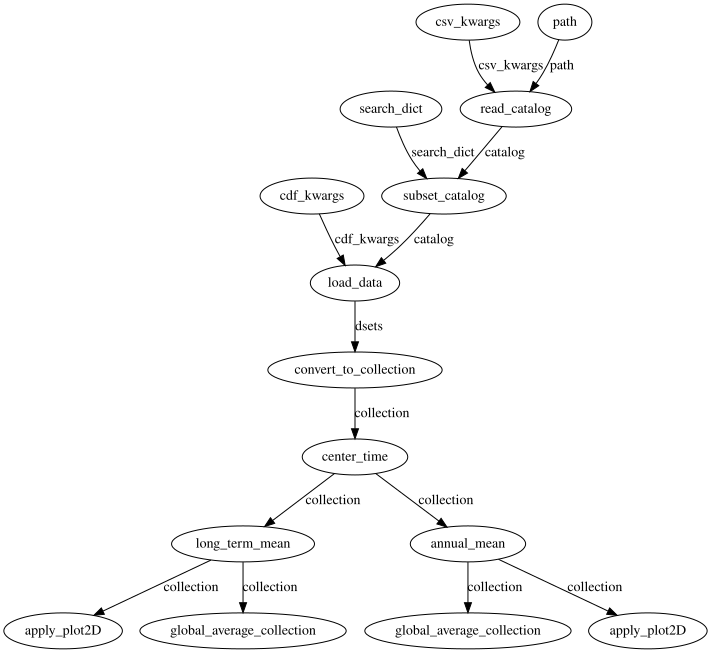

In [18]:
timeseries_collection_from_json.visualize()

In [143]:
timeseries_global_average = timeseries_collection_from_json.run(path="/glade/campaign/cesm/development/omwg/projects/MOMMARBL_vs_POPECO/catalog/MOMvsPOP.json",
                                                                search_dict={'stream':'pop.h', 'variable':['TEMP', 'SALT', 'FG_CO2', 'TAREA']})

[2021-12-01 14:54:34-0700] INFO - prefect.FlowRunner | Beginning Flow run for 'timeseries_collection_from_json'
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'search_dict': Starting task run...
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'search_dict': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'path': Starting task run...
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'path': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Starting task run...
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'csv_kwargs': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Starting task run...
[2021-12-01 14:54:34-0700] INFO - prefect.TaskRunner | Task 'cdf_kwargs': Finished task run for task with final state: 'Success'
[2

[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'load_data': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'convert_to_collection': Starting task run...
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'convert_to_collection': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'center_time': Starting task run...
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'center_time': Finished task run for task with final state: 'Success'
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'long_term_mean': Starting task run...
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'long_term_mean': Finished task run for task with final state: 'Cached'
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'annual_mean': Starting task run...
[2021-12-01 14:54:45-0700] INFO - prefect.TaskRunner | Task 'annual_mean'

[2021-12-01 14:55:07-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Finished task run for task with final state: 'Success'
[2021-12-01 14:55:07-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Starting task run...


[2021-12-01 14:55:10-0700] INFO - prefect.TaskRunner | Task 'apply_plot2D': Finished task run for task with final state: 'Success'
[2021-12-01 14:55:10-0700] INFO - prefect.TaskRunner | Task 'global_average_collection': Starting task run...
[2021-12-01 14:55:11-0700] INFO - prefect.TaskRunner | Task 'global_average_collection': Finished task run for task with final state: 'Success'
[2021-12-01 14:55:11-0700] INFO - prefect.FlowRunner | Flow run SUCCESS: all reference tasks succeeded


In [145]:
long_term_global_average_collection = xc.open_collection(f'{cache_dir}/long_term_global_average')
annual_global_average_collection = xc.open_collection(f'{cache_dir}/annual_global_average')

In [156]:
annual_global_average_collection['ocn.pop.h.pop_control'].TEMP.hvplot.contourf(x='year', ylim=(100000, 0), cmap='magma', levels=20)

:Polygons   [year,z_t]   (TEMP)